# Self-Driving Car Engineer Nanodegree


## Project: **Advanced - Finding Lane Lines on the Road** 
***
Camera Callibration

---

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import os
%matplotlib inline

#calibration images are 6 rows and 9 cols
nx = 9
ny = 6
cam_matrix_list = []
dist_list = []
avg_cam_matrix = None
avg_dist = None
#one frame older values
old_confidence  =  0
old_leftx_base  =  0
old_rightx_base =  0
old_histogram   =  None


## Find the undistorted, warped(front on) image and the perspective transform matrix


In [2]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist,corners,gray):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 100 pixels is not exact, but close enough for our purpose here
    offset = 100 # offset for dst points
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])

    # For source points I'm grabbing the outer four detected corners
    print("0=",corners[0])
    print("nx-1=",corners[nx-1])
    #print("-1=",corners[-1])
    #print("-nx=",corners[-nx])
    src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                 [img_size[0]-offset, img_size[1]-offset], 
                                 [offset, img_size[1]-offset]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting undistorted & warped(front on)image and xform matrix
    return undist, warped, M

## Glob filenames and Read in an Images

Unable to findChessboard... camera_cal/calibration1.jpg
Curr Dist= [[-0.24236876  0.29461093  0.01910478  0.00032653 -0.21494586]]
Curr cam mat= [[ 878.36220518    0.          641.10477419]
 [   0.          850.22573416  237.43088632]
 [   0.            0.            1.        ]]
0= [[ 149.49775696  169.30505371]]
nx-1= [[ 1204.5   182. ]]


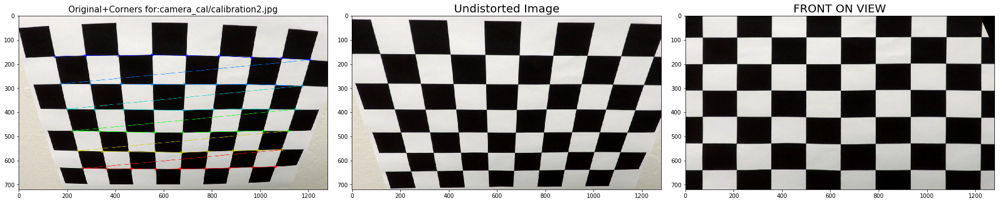

Curr Dist= [[ -3.40631074e-01   5.29842349e-01  -1.88821272e-03  -2.69112177e-04
   -9.52732972e-01]]
Curr cam mat= [[  1.19370682e+03   0.00000000e+00   6.67597083e+02]
 [  0.00000000e+00   1.19809253e+03   3.93088442e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 224.43623352   78.43923187]]
nx-1= [[ 1022.05981445    84.68122101]]


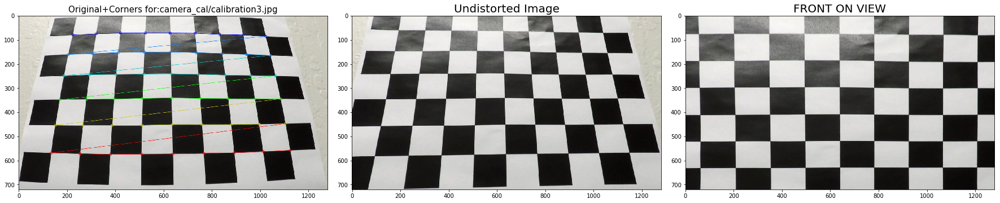

Unable to findChessboard... camera_cal/calibration4.jpg
Unable to findChessboard... camera_cal/calibration5.jpg
Curr Dist= [[ -3.40497938e-01   5.60803750e-01  -1.04750478e-03   4.98663742e-05
   -9.93285151e-01]]
Curr cam mat= [[  1.17897679e+03   0.00000000e+00   6.65063257e+02]
 [  0.00000000e+00   1.17745243e+03   3.89070530e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 483.0284729   241.91783142]]
nx-1= [[ 784.00561523  238.97976685]]


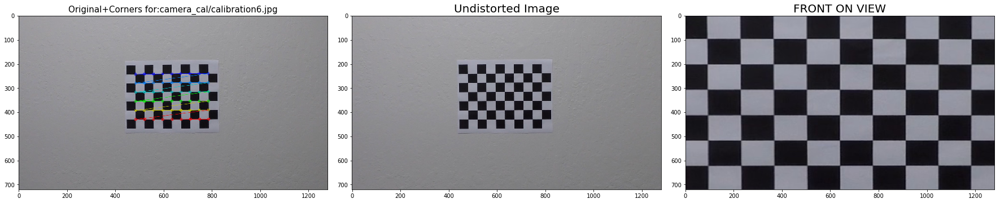

Curr Dist= [[ -3.38643695e-01   5.42454007e-01  -9.00555564e-04   1.11258463e-04
   -9.35773378e-01]]
Curr cam mat= [[  1.17633634e+03   0.00000000e+00   6.64405557e+02]
 [  0.00000000e+00   1.17389116e+03   3.88425698e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 331.51535034  272.02346802]]
nx-1= [[ 534.63018799  254.20600891]]


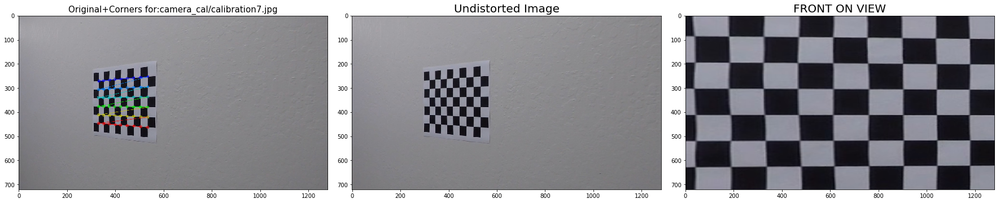

Curr Dist= [[ -3.53475918e-01   6.48597243e-01  -7.53939775e-04   7.93145198e-05
   -1.14528541e+00]]
Curr cam mat= [[  1.17538433e+03   0.00000000e+00   6.63118812e+02]
 [  0.00000000e+00   1.17235644e+03   3.87579491e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 710.10125732  216.3573761 ]]
nx-1= [[ 979.40203857  244.12901306]]


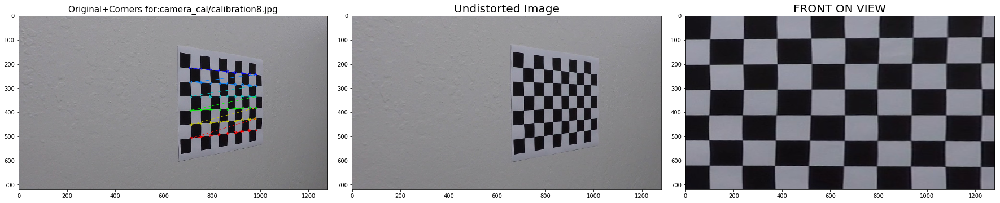

Curr Dist= [[ -3.57114731e-01   6.75639803e-01  -7.22556676e-04   1.41247744e-05
   -1.19881509e+00]]
Curr cam mat= [[  1.17491924e+03   0.00000000e+00   6.61751981e+02]
 [  0.00000000e+00   1.17169142e+03   3.87695182e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 623.08099365  147.12086487]]
nx-1= [[ 874.96228027  253.91186523]]


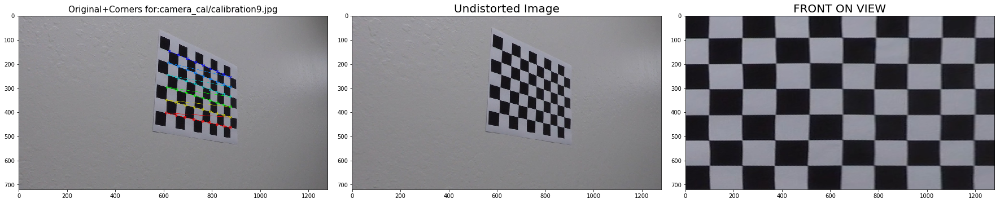

Curr Dist= [[ -3.58292529e-01   6.86109028e-01  -7.14867226e-04   4.58482438e-05
   -1.22233102e+00]]
Curr cam mat= [[  1.17486015e+03   0.00000000e+00   6.62256762e+02]
 [  0.00000000e+00   1.17144355e+03   3.86712732e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 545.32366943  343.10897827]]
nx-1= [[ 972.61602783  336.58230591]]


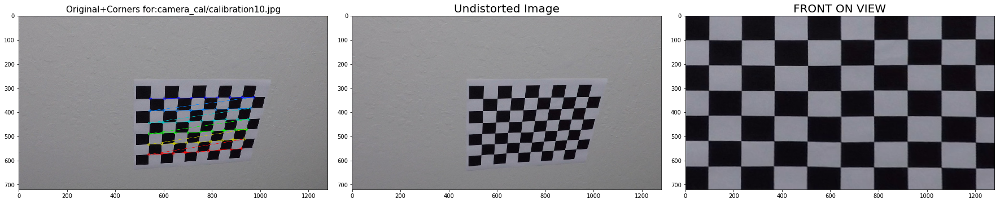

Curr Dist= [[ -3.89551159e-01   1.01586231e+00  -9.51904773e-04   3.36474151e-04
   -2.10993144e+00]]
Curr cam mat= [[  1.17580390e+03   0.00000000e+00   6.68879207e+02]
 [  0.00000000e+00   1.17311118e+03   3.86707466e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[  99.72121429  268.77389526]]
nx-1= [[ 281.51119995  255.17933655]]


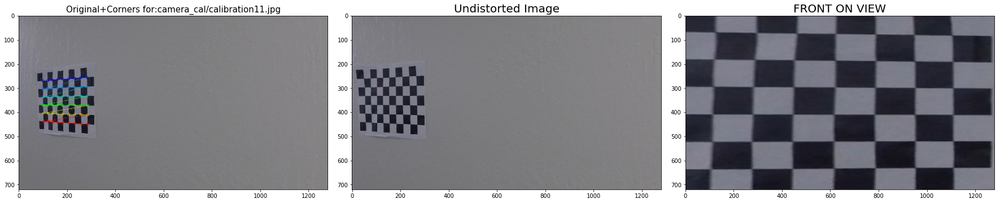

Curr Dist= [[ -3.08541493e-01   5.02873061e-01  -4.79374073e-04   7.67047581e-04
   -1.10039536e+00]]
Curr cam mat= [[  1.16046028e+03   0.00000000e+00   6.70025618e+02]
 [  0.00000000e+00   1.15468324e+03   3.84028467e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 658.31304932  203.33424377]]
nx-1= [[ 1070.75695801   171.56767273]]


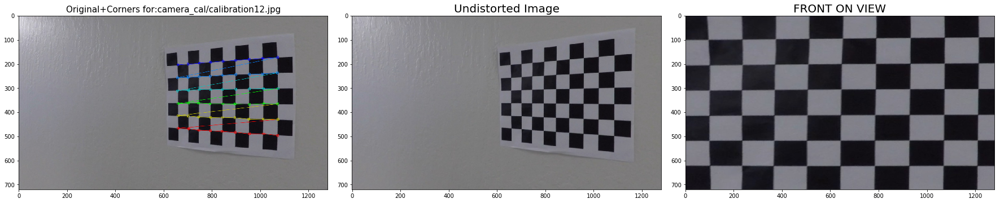

Curr Dist= [[ -3.44831374e-01   7.41401299e-01  -3.45112356e-04   1.08520648e-03
   -1.52587556e+00]]
Curr cam mat= [[  1.15784433e+03   0.00000000e+00   6.69000599e+02]
 [  0.00000000e+00   1.15036556e+03   3.83472638e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 410.59161377  317.79888916]]
nx-1= [[ 650.5  117.5]]


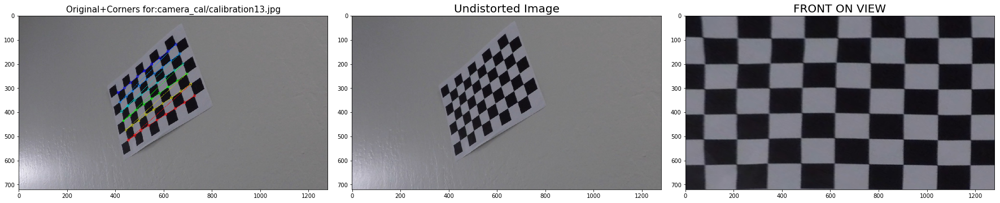

Curr Dist= [[ -2.98263610e-01   4.04692659e-01  -4.09831189e-04   7.52582549e-04
   -8.75435459e-01]]
Curr cam mat= [[  1.15396474e+03   0.00000000e+00   6.67038428e+02]
 [  0.00000000e+00   1.14614055e+03   3.83912136e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 960.98242188  147.07434082]]
nx-1= [[ 1205.7175293    187.14526367]]


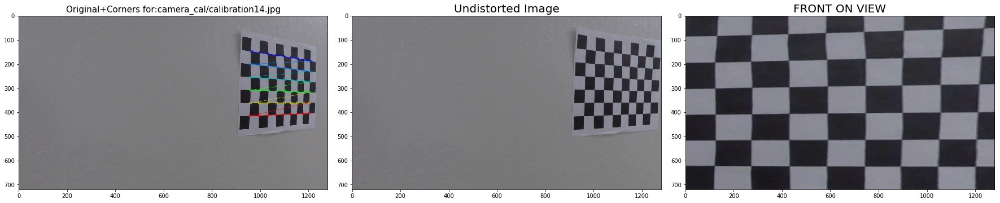

Curr Dist= [[ -2.63997445e-01   1.88508325e-01  -5.97540207e-04   3.40411329e-04
   -5.22197215e-01]]
Curr cam mat= [[  1.15099869e+03   0.00000000e+00   6.61906695e+02]
 [  0.00000000e+00   1.14328939e+03   3.83591307e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 926.29937744  303.87768555]]
nx-1= [[ 1199.71533203   327.9083252 ]]


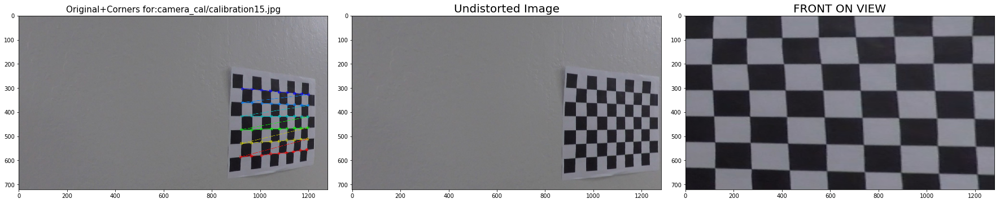

Curr Dist= [[ -1.95393106e-01  -3.40580398e-01  -6.40954171e-04  -3.56973998e-05
    5.90546356e-01]]
Curr cam mat= [[  1.14789426e+03   0.00000000e+00   6.57983368e+02]
 [  0.00000000e+00   1.14004175e+03   3.86836680e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 946.59112549  102.16585541]]
nx-1= [[ 1219.34655762   132.79545593]]


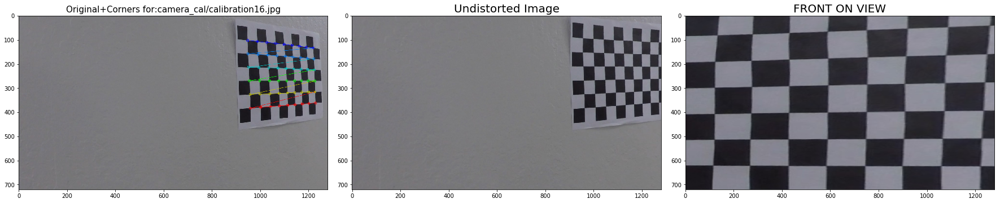

Curr Dist= [[ -2.25579471e-01  -1.61681684e-01  -1.24610255e-03   1.56452391e-04
    2.65744765e-01]]
Curr cam mat= [[  1.15119758e+03   0.00000000e+00   6.61418689e+02]
 [  0.00000000e+00   1.14472740e+03   3.86621134e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 403.22183228  297.9616394 ]]
nx-1= [[ 929.95031738  304.15402222]]


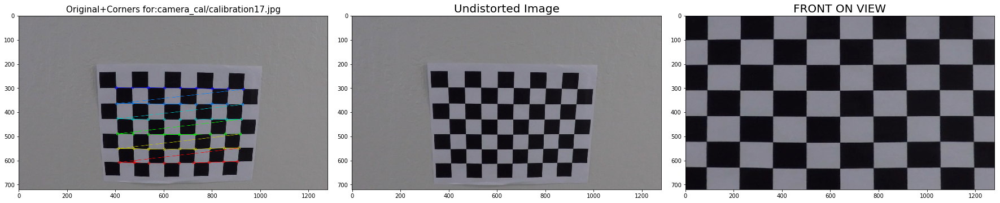

Curr Dist= [[ -2.30771154e-01  -1.32608482e-01  -1.21978683e-03  -1.68998638e-04
    2.22887969e-01]]
Curr cam mat= [[  1.15079980e+03   0.00000000e+00   6.60848646e+02]
 [  0.00000000e+00   1.14392404e+03   3.87789962e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[ 437.5  125.5]]
nx-1= [[ 937.41986084  129.99989319]]


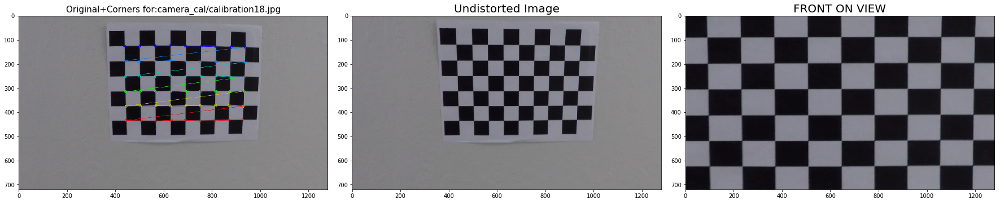

Curr Dist= [[ -2.22635046e-01  -1.74593738e-01  -1.29721441e-03  -6.85710891e-05
    2.67008990e-01]]
Curr cam mat= [[  1.15049668e+03   0.00000000e+00   6.62686645e+02]
 [  0.00000000e+00   1.14376708e+03   3.87492298e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[  88.20872498  138.82823181]]
nx-1= [[ 364.47021484  115.85635376]]


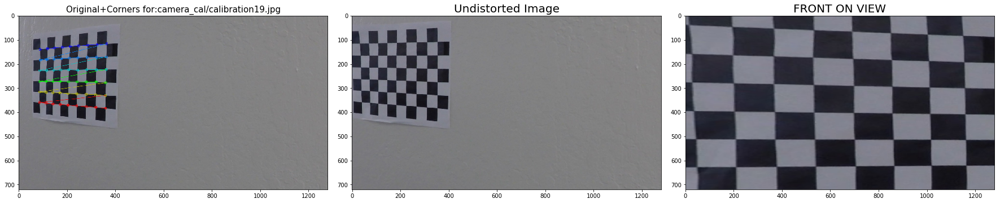

Curr Dist= [[ -2.35510339e-01  -7.90388401e-02  -1.28492203e-03   8.25970403e-05
    7.22743173e-02]]
Curr cam mat= [[  1.15158804e+03   0.00000000e+00   6.66167057e+02]
 [  0.00000000e+00   1.14506859e+03   3.86440204e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
0= [[  84.  363.]]
nx-1= [[ 350.06072998  358.5163269 ]]


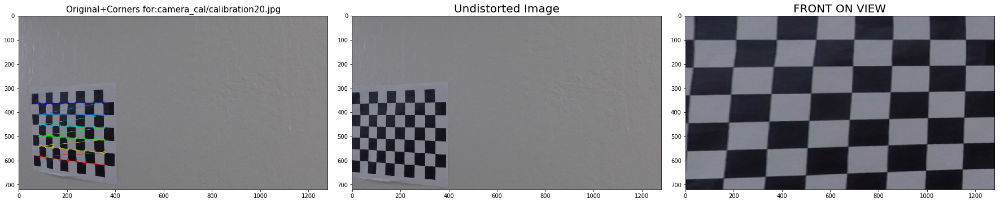

Avg dist= [[ -2.96829344e-01   3.47228919e-01   2.70847212e-04   2.12078772e-04
   -6.69325971e-01]]
Avg matrix =  [[  1.14727025e+03   0.00000000e+00   6.63014893e+02]
 [  0.00000000e+00   1.14119247e+03   3.78052662e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]


In [3]:
#reading in all image names by globbing
#images = glob.glob('camera_cal/cal*.jpg')

#I DECIDED TO COMMENT OUT ABOVE BECAUSE I KNOW THE NAMES AND THIS IS JUST TO CALIBRATE

#arrays to store obj points and img points used in callibration
objpoints = []
imgpoints = []
offset = 100

#prepare obj points ...we have 6 rows(x axis), 9 columns(y axis) and z-axis which is always 0 
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) #x,y cord

for idx in range(1,21):
    #read in each image file
    fname = 'camera_cal/calibration'+str(idx)+'.jpg'
    img = mpimg.imread(fname)
    
    #convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret == False:
        print("Unable to findChessboard...",fname)
    else:
        #print("Processing...",fname)
        imgpoints.append(corners)
        objpoints.append(objp)
        
        #draw/display
        img1 = img.copy()
        img1 = cv2.drawChessboardCorners(img1, (nx,ny), corners, ret)
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        dist_list.append(dist)
        #print("corners=", corners.shape)
        cam_matrix_list.append(mtx)
        dist_list.append(dist)
        print("Curr Dist=", dist)
        print("Curr cam mat=", mtx)
        
        #get the undistorted & warped image along with M, the matrix for perspective xform
        undist, warped, persp_trans_matrix = corners_unwarp(img,nx,ny,mtx,dist,corners,gray)
        
        #This section just displays the before and after
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img1)
        ax1.set_title('Original+Corners for:'+fname, fontsize=15)
        ax2.imshow(undist)
        ax2.set_title('Undistorted Image', fontsize=20)
        ax3.imshow(warped)
        ax3.set_title('FRONT ON VIEW', fontsize=20)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()
        plt.close()

# Average out the persp_trans_matrix and the dist coefficients
avg_dist = np.mean(dist_list,axis=0)
avg_cam_matrix = np.mean(cam_matrix_list, axis=0)
print("Avg dist=", avg_dist)
print("Avg matrix = ", avg_cam_matrix)

## Ideas for Lane Detection Pipeline..sobel derivative function

## Helper Functions

---

** Keep the helper functions from 1st project and add the new threshold functions



Below are some helper functions to help get you started. They should look familiar from the lesson!

In [4]:
import math
import numpy
import cv2

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines_old(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)
            
def linregress(lines2):
        all_x = [x1 for x1,y1,x2,y2,slope,intercept in lines2 ]
        all_x.extend([x2 for x1,y1,x2,y2,slope,intercept in lines2 ])

        all_y = [y1 for x1,y1,x2,y2,slope,intercept in lines2 ]
        all_y.extend([y2 for x1,y1,x2,y2,slope,intercept in lines2 ])
        A = numpy.vstack([all_x, numpy.ones(len(all_x))]).T
        m2,c2 = np.linalg.lstsq(A,all_y)[0]
        #print("SLOPE / INTERCEPT:", m2, c2)
        line2_y1 = 300
        line2_y2 = 540
        line2_x1 = int((line2_y1 - c2)/m2)
        line2_x2 = int((line2_y2 - c2)/m2)
        return (line2_x1,line2_y1, line2_x2, line2_y2)

    

def averageOutLines(listOfLines):
        global m1_avg
        global m2_avg
        #'CV_DIST_L2 CV_DIST_L1 CV_DIST_L12 CV_DIST_FAIR CV_DIST_WELSCH CV_DIST_HUBER'
        all_points = [ (x1,y1) for x1,y1,x2,y2,slope,intercept in listOfLines ]
        all_points.extend([ (x2,y2) for x1,y1,x2,y2,slope,intercept in listOfLines ])
        
        #for ln in listOfLines:
        #    print(ln)
        vx, vy, cx, cy = cv2.fitLine(np.float32(all_points), 2, 0, 0.01, 0.01)
        m = vy/vx
        c = cy-(m*cx)
        return m,c

def draw_lines(top_y,bottom_y,img, lines, color=[255, 0, 0], thickness=10):
    
    
    """
    We get an array of lines, one for left edge and one for right edge
    If the difference between 1st and 2nd is less than 0.2(picked empirically)
    then its the same line...average it out...else add it to other line...average it out
    """
    lines1 = []
    lines2 = []
    line1_count = 0
    line2_count = 0
    for line in lines:
        for x1,y1,x2,y2 in line:
            
            slope_curr = (y2-y1)/(x2-x1)
            intercept_curr = y1 - slope_curr*x1
            
            #IF slope is TOO vertical (greater than 4) or TOO horizontal(less than 1/4)
            #skip over this bogus line
            if math.fabs(slope_curr) > 3 or math.fabs(slope_curr) < (1/3) :
                #print("THat was too flat or too steep", slope_curr)
                continue
            
            
            #1st iteration...is always 1st line slope
            if line1_count == 0 and line2_count == 0:  
                lines1.append( (x1,y1,x2,y2,slope_curr, intercept_curr) )
                line1_count += 1
                line1_slope = slope_curr
                #print("FIRST Line x1,y1,x2,y2",line, "slope/intercept:",slope_curr, intercept_curr)
                
            else:
                #all other iterations
                #if line close enf to 1st line add it there else add it to the other(line2)
                if (slope_curr - line1_slope < 0.2) and (slope_curr - line1_slope > -0.2):
                    lines1.append( (x1,y1,x2,y2,slope_curr, intercept_curr) )
                    line1_count += 1
                    #print("FIRST Line x1,y1,x2,y2",line, "slope/intercept:",slope_curr, intercept_curr)
                    
                else:
                    
                    lines2.append( (x1,y1,x2,y2,slope_curr, intercept_curr) )
                    line2_count += 1
                    #print("SECOND Line x1,y1,x2,y2",line, "slope/intercept:",slope_curr, intercept_curr)
    
    # What lines did we separate
    
    m1,c1 = averageOutLines(lines1)
    if len(lines2) > 0:
        m2,c2 = averageOutLines(lines2)        
    else:
        m2 = 0;
        c2 = 0;
    
    m1,c1,m2,c2 = averageAcrossFrames(m1,c1,m2,c2)
    
    line1_x1, line1_y1,line1_x2, line1_y2 = getLine(top_y, bottom_y, m1,c1)

    line2_x1, line2_y1,line2_x2, line2_y2 = getLine(top_y, bottom_y, m2,c2)

    #draw lines averaged over frames
    #img, pts, isClosed, color[, thickness[, lineType[, shift]]]
    
    #cv2.line(img, (line1_x1, line1_y1), (line1_x2, line1_y2), color, thickness)
    pts1 = np.array([[line1_x1, line1_y1],[line1_x2, line1_y2]], np.int32)
    for x1,y1,x2,y2,_,_ in lines1:
        np.vstack((pts1, [ x1,y1],[ x2,y2]) );
    
    cv2.polylines(img, [pts1], False, (255,0,0), 10)
    
    
    pts2 = np.array([[line2_x1, line2_y1],[line2_x2, line2_y2]], np.int32)
    for x1,y1,x2,y2,_,_ in lines2:
        np.vstack( (pts2, [ x1,y1], [ x2,y2]) );
    
    #cv2.line(img, (line2_x1, line2_y1), (line2_x2, line2_y2), color, thickness)
    cv2.polylines(img, [pts2], False, (255,0,0), 10)

def averageAcrossFrames(m1,c1,m2,c2):
    global m1_avg,m2_avg,c1_avg,c2_avg
    #return 2 slopes from this bunch of lines to help smooth out and average next bunch
    #always return smaller 1st and bigger next
    if m1 > m2:    
        tempM = m1
        m1 = m2
        m2 = tempM
        tempC = c1
        c1 = c2
        c2 = tempC
    #Now m1 is lesser, m2 is larger...average it out with previous frames values
    if m1_avg == 0:
        m1_avg = m1
        c1_avg = c1
        m2_avg = m2
        c2_avg = c2
        #print("Shoud only print once!!!!!!!!!!!")
    else:
        #print("Before average:m1_avg=", m1_avg, "m1=",m1, "m2_avg=", m2_avg, "m2=", m2)
        #give more weight to the cumulative past avg...reduces jitter
        m1_avg = (2*m1_avg+m1)/3
        c1_avg = (2*c1_avg+c1)/3
        m2_avg = (2*m2_avg+m2)/3
        c2_avg = (2*c2_avg+c2)/3
        #print("AFTER average:m1_avg=", m1_avg, "m1=",m1, "m2_avg=", m2_avg, "m2=", m2)
    return m1_avg,c1_avg,m2_avg,c2_avg


def getLine(top_y, bottom_y, m,c):      
        line_y1 = top_y
        line_y2 = bottom_y
        line_x1 = int((line_y1 - c)/m)
        line_x2 = int((line_y2 - c)/m)
        return line_x1,line_y1, line_x2, line_y2
    
    


def hough_lines(top_y, bottom_y, img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(top_y, bottom_y, line_img, lines)
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


#All 3 gradient related threshold funcgtions new to this advanced lane finding
def abs_sobel_thresh(gray, sobel_kernel=9, orient='x', thresh=(20,100)):
    
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(gray, sobel_kernel=9, mag_thresh=(30, 100)):
    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def combinedSobel(img, s_thresh=(170, 200), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary


## Test Images

Build pipeline to work on the images in the directory "test_images" (just like in project 1) 

**I want to make sure pipeline works well on these images before trying the videos.**

## Use Test images (esp the 2 straight lines images) to guess the destination points.
The name of the 2 files is a clue to adjust src and dest till you see straight parallel lines
Once done, use the same src / dest and camera props (callibrate/distort co-efficeints) on the curved lane images and ensure that we get curved but parallel lines

This function is more or less straight from the lessons. The primary change is it accepts src dest in addition to the other camera params

Once I get this, I can apply this src/dest points to this camera, with this mount(perspective) with this distortion coefficients...to the rest of the stream of images in the video.

In [6]:

## SLiding window search and visualization
def slidingWindow(binary_warped,warpedColorImg,histogram):
    global old_confidence
    global old_leftx_base
    global old_rightx_base
    global old_histogram
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    confidence = np.max([ histogram[leftx_base], histogram[rightx_base] ])
    
    
    #initially I was averaging out only if there was low confidence
    #but there is no harm to do that even if you have good confidence
    #in subsequent frames...average of two nbrs close is the number itself.
    if old_confidence > 0:
        #average out the confidence and the peaks
        old_confidence  = (old_confidence + confidence)/2.0
        old_leftx_base  = (old_leftx_base+leftx_base)/2.0
        old_rightx_base = (old_rightx_base+rightx_base)/2.0
        old_histogram   = (old_histogram + histogram)/2.0
        histogram = old_histogram
        leftx_base = int(old_leftx_base)
        rightx_base = int(old_rightx_base)
    else:
        #use the new histogram totally
        old_confidence  =  confidence
        old_leftx_base  =  leftx_base
        old_rightx_base =  rightx_base
        old_histogram   =  histogram
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    #OLD STYLE from lesson
    #left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    #Explanation of MY Algorithm
    #LANE'S LEFT AND RIGHT sides must be parallel, i.e. this is a problem of drawing a parallel or offset curve
    #SO I am going to find out which side of the lane am I more confident about,
    #i.e. whose peak is higher and use it as an anchor and draw the other side as an 
    #offset curve
    # This is similar to how we drive when we have poor conditions(snow on one side or 
    # light from oncoming traffic)...
    # U focus on the side of the lane u can see well and trust that the lanes are parallel :)
    
    #print("Left Peak at", leftx_base, " value of =", histogram[leftx_base], " right peak at", rightx_base, " value of = ", histogram[rightx_base])
    # I know that for this perspective, the lane width is just around 530 pixels
    # I am going slightly conservative and assume 525 pixels
    laneWidth = 530
    laneMargin = 10
    #which side left or right do I know with more certainty?
    #IF I can see left side better
    if histogram[leftx_base] > histogram[rightx_base]:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = left_fitx + laneWidth
    else:
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        left_fitx = right_fitx - laneWidth
    
    #out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    #out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    #plt.imshow(out_img)    
    #plt.plot(left_fitx, ploty, color='yellow',lw=5)
    #plt.plot(right_fitx, ploty, color='yellow',lw=5)
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    #plt.imshow(warpedColorImg)
    #print(warpedColorImg.shape)
    #print('left_fitx shape=', left_fitx.shape)
    
    for idx in range(0,720):       
        warpedColorImg[idx, int(left_fitx[idx])+laneMargin:int(right_fitx[idx])-laneMargin]=[255,255,255]
        
    return warpedColorImg,left_fitx,right_fitx
    


Images: ['straight_lines1.jpg', 'straight_lines2.jpg', 'test1.jpg', 'test2.jpg', 'test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']


IMAGE BELOW: straight_lines1.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


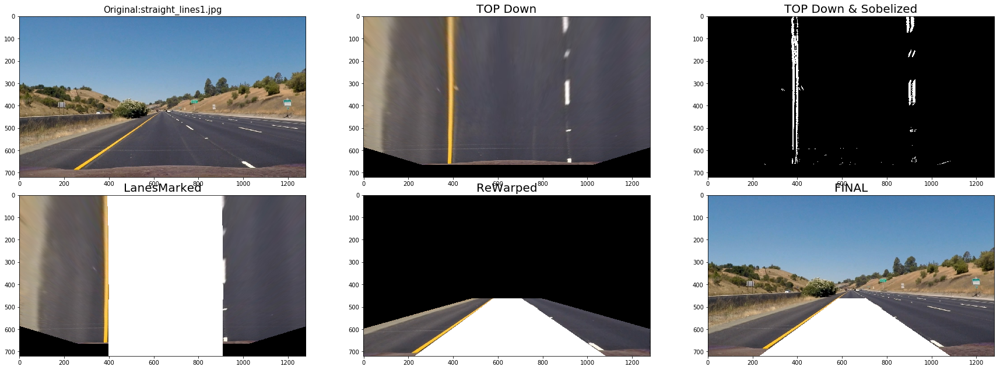



IMAGE BELOW: straight_lines2.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


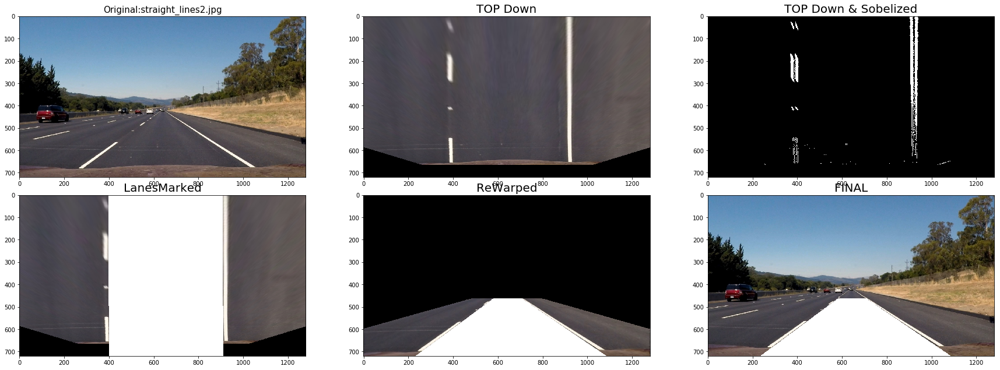



IMAGE BELOW: test1.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


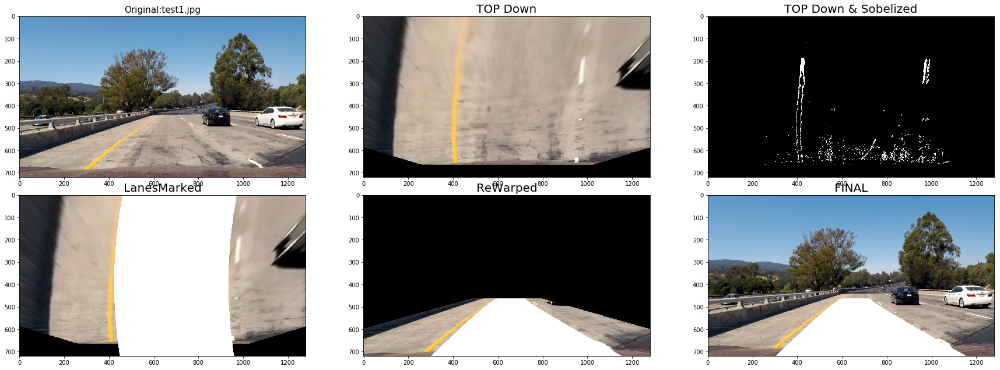



IMAGE BELOW: test2.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


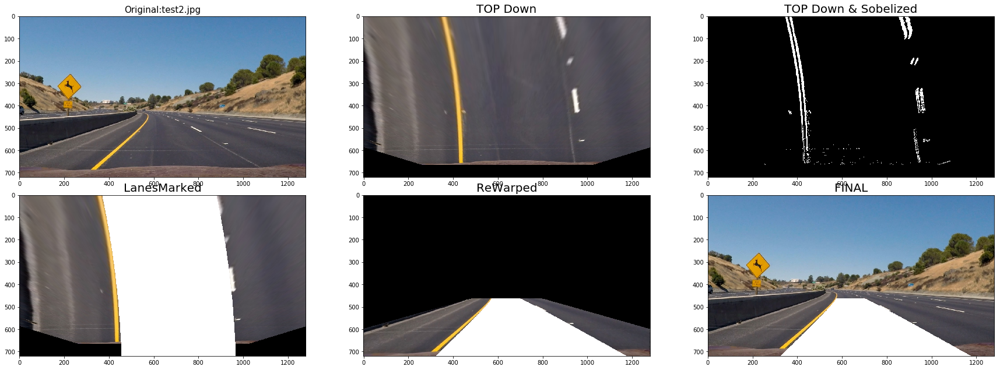



IMAGE BELOW: test3.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


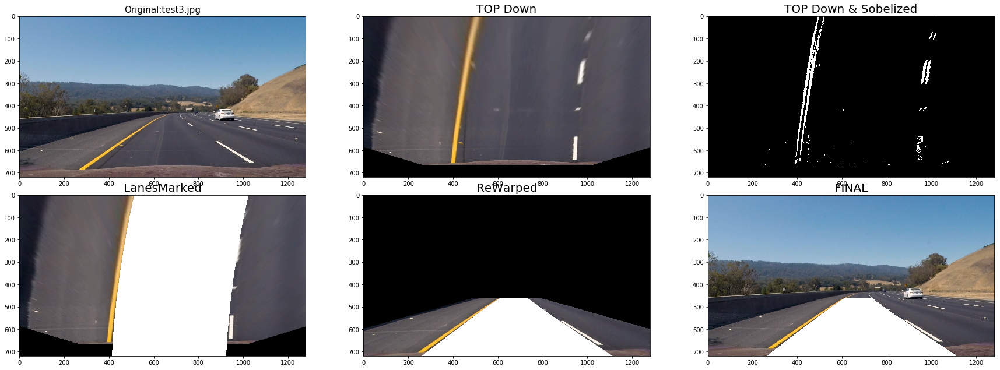



IMAGE BELOW: test4.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


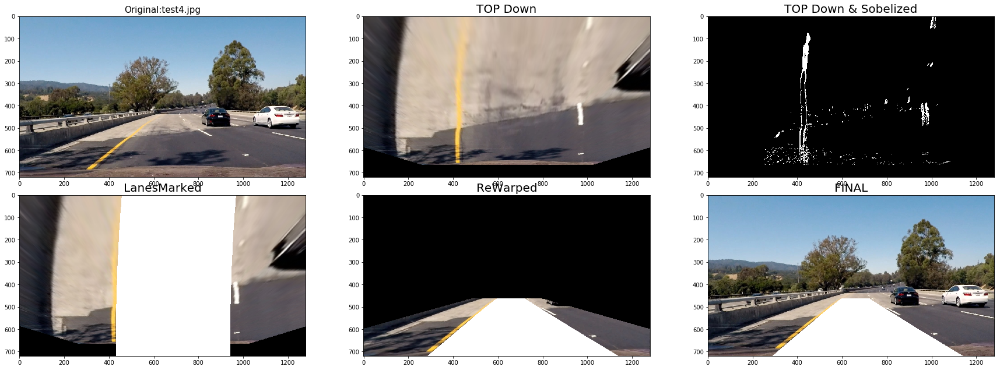



IMAGE BELOW: test5.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


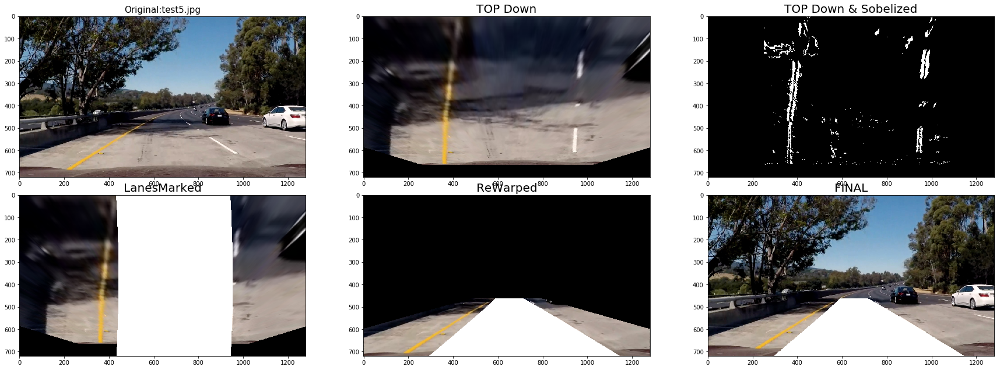



IMAGE BELOW: test6.jpg  of type: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)
markedOrigPersp.shape (720, 1280, 3)


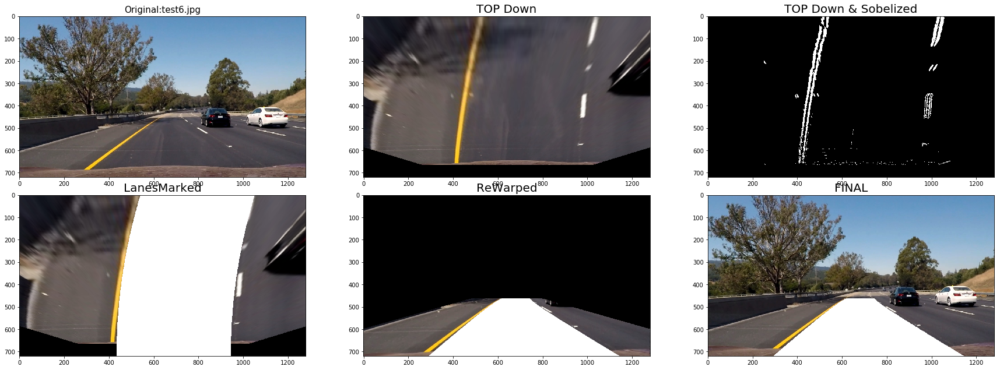

==========================================END====================================================


In [7]:
def corners_unwarp2(img, nx, ny, mtx, dist,src,dst,gray):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 100 pixels is not exact, but close enough for our purpose here
    offset = 100 # offset for dst points
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])

    # For source points I'm grabbing the outer four detected corners
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting undistorted & warped(front on)image and xform matrix
    return undist, warped, M, M_inv

# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images directory.
#above returns a list of files. Once I get the pipeline working
#I plan to put this in a for loop for each image

perspMatrix = None #will be filled in by straight_lines1 and validated by straight_lines2
imglist = os.listdir("test_images/")
print('Images:', imglist)
for imgNm in imglist: 
    
    image = mpimg.imread('test_images/'+imgNm)
    print("\n\n==============================================================================================")
    print('IMAGE BELOW:', imgNm, " of type:", type(image), 'with dimesions:', image.shape)
    print("==============================================================================================")
    
    #Trial 1...not getting enough curvatture
    #s1_corners = np.float32([[545,570], [755,570],[300, 735], [1000,735]] ) #height 65
    #by trial and error till I got parallel lines
    #d1_corners = np.float32([[520,100], [770,100],[450, 720], [850,720]] )#destination 

    #IN between tried a lot of destination points which gave good birds eye view of curvature
    #without loss of clarity....thats the "optimization function" I did trial and error with

    #Zoom out the perspective to get a better guestimate of curvature
    s1_corners = np.float32([[545,570], [755,570],[300, 735], [1000,735]] ) #height 65
    #by trial and error till I got parallel lines
    d1_corners = np.float32([[530,550], [779,550],[450, 670], [848,670]] )#destination 
    #perspective transform
    ig1, unwarpedPersp, perspMatrix, inversePerspMatrix = corners_unwarp2(image, 2, 2, avg_cam_matrix, avg_dist,s1_corners,d1_corners,grayscale(image))
        
    #now apply combinedSobel to these unwarped images ( unwarpedPersp )    
    warpedBin = combinedSobel(unwarpedPersp)
    
    vertices = np.array([[[250,image.shape[0]],
                          [250,0],
                          [image.shape[1]-200,0],
                          [image.shape[1]-200,image.shape[0]]]], 
                        dtype=np.int32)
    warpedBin = region_of_interest(warpedBin,vertices)
    
    #This section just displays the before and after
    f, (ax1,ax2) = plt.subplots(2, 3, figsize=(24, 9))
    f.tight_layout()
    ax1[0].imshow(image)
    ax1[0].set_title('Original:'+imgNm, fontsize=15)
    
    ax1[1].imshow(unwarpedPersp,cmap='gray')
    ax1[1].set_title('TOP Down', fontsize=20)
    
    ax1[2].imshow(warpedBin,cmap='gray')
    ax1[2].set_title('TOP Down & Sobelized', fontsize=20)
    #calc and show histogram to detect lane lines

    hist_ogram = np.sum(warpedBin[warpedBin.shape[0]//2:,:], axis=0)
    #ax4.imshow(histogram)
    #ax4.set_title('Histogram', fontsize=20)
    
    outimg,left_fitx,right_fitx = slidingWindow(warpedBin,unwarpedPersp,hist_ogram)
    ax2[0].imshow(outimg)
    ax2[0].set_title('LanesMarked', fontsize=20)
    
    markedOrigPersp = cv2.warpPerspective(outimg, inversePerspMatrix, img_size)
    ax2[1].imshow(markedOrigPersp)
    ax2[1].set_title('ReWarped', fontsize=20)
    
    print('markedOrigPersp.shape', markedOrigPersp.shape)
    RChannelIsFull = markedOrigPersp[:,:,0] == 255
    GChannelIsFull = markedOrigPersp[:,:,1] == 255
    BChannelIsFull = markedOrigPersp[:,:,2] == 255
    allWhitePixels = np.logical_and(RChannelIsFull, GChannelIsFull)
    allWhitePixels = np.logical_and(allWhitePixels, BChannelIsFull)
    #print('allwhite', allWhitePixels, allWhitePixels.shape)
    finalImage = image.copy()
    # struggling to make the white area transparent
    #finalImage = numpy.concatenate((finalImage, numpy.ones((720, 1280, 1))), axis=2)
    finalImage[allWhitePixels == True] = [255,255,255]
    
    ax2[2].imshow(finalImage)
    ax2[2].set_title('FINAL', fontsize=20)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    plt.close()
print("==========================================END====================================================")


In [8]:
def writeCurvatureNOffCenter(image,leftx,rightx):
    ploty = np.linspace(0,719,num=720,dtype=int)
    y_eval = np.max(ploty)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    lanecenter = (leftx[719] + rightx[719])/2.0;
    imageCenter = 1280/2
    offsetCenterInPixels = np.abs(imageCenter-lanecenter)
    xm_per_pix = 3.7/700
    offsetCenterInMeters = round((offsetCenterInPixels * xm_per_pix), 3)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(image,"Off Center="+str(offsetCenterInMeters),   (10,50), font, 0.5,(0,0,0),2)
    cv2.putText(image,"Left Rad  ="+str(round(left_curverad,3)), (10,70), font, 0.5,(0,0,0),2)
    cv2.putText(image,"Right Rad ="+str(round(right_curverad,3)),(10,90), font, 0.5,(0,0,0),2)
    # Example values: 632.1 m    626.2 m

def findLanes(image):
    
    #Zoom out the perspective to get a better guestimate of curvature
    s1_corners = np.float32([[545,570], [755,570],[300, 735], [1000,735]] ) #height 65
    #by trial and error till I got parallel lines
    d1_corners = np.float32([[530,550], [779,550],[450, 670], [848,670]] )#destination 
    #perspective transform
    ig1, unwarpedPersp, perspMatrix, inversePerspMatrix = corners_unwarp2(image, 2, 2, avg_cam_matrix, avg_dist,s1_corners,d1_corners,grayscale(image))
        
    #now apply combinedSobel to these unwarped images ( unwarpedPersp )    
    warpedBin = combinedSobel(unwarpedPersp)
    
    vertices = np.array([[[250,image.shape[0]],
                          [250,0],
                          [image.shape[1]-200,0],
                          [image.shape[1]-200,image.shape[0]]]], 
                        dtype=np.int32)
    warpedBin = region_of_interest(warpedBin,vertices)
    
    #This section just displays the before and after
    # image is the original frame
    
    #unwarpedPersp is the top down view of it after perspective transform
    
    #warpedBin is the TOP DOWN and SOBELIZED version of that image
    
    #calc and show histogram to detect left and right peaks of lane lines
    hist_ogram = np.sum(warpedBin[warpedBin.shape[0]//2:,:], axis=0)
    
    #outimg is the unwarpedPersp marked up after lanes were found and marked pure white
    outimg,left_fitx,right_fitx = slidingWindow(warpedBin,unwarpedPersp,hist_ogram)
    
    #Rewarp the perspective to the original with the lanes marked pure white
    markedOrigPersp = cv2.warpPerspective(outimg, inversePerspMatrix, img_size)
    
    #Apply that pure white mask back to the original image
    RChannelIsFull = markedOrigPersp[:,:,0] == 255
    GChannelIsFull = markedOrigPersp[:,:,1] == 255
    BChannelIsFull = markedOrigPersp[:,:,2] == 255
    allWhitePixels = np.logical_and(RChannelIsFull, GChannelIsFull)
    allWhitePixels = np.logical_and(allWhitePixels, BChannelIsFull)
    #print('allwhite', allWhitePixels, allWhitePixels.shape)
    finalImage = image.copy()
    # struggling to make the white area transparent
    #finalImage = numpy.concatenate((finalImage, numpy.ones((720, 1280, 1))), axis=2)
    finalImage[allWhitePixels == True] = [255,255,255]
    
    writeCurvatureNOffCenter(finalImage,left_fitx,right_fitx)
    
    return finalImage


## Test on Videos



In [9]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [10]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    result = findLanes(image)
    return result

Let's try the one with the solid white lane on the right first ...

In [11]:
white_output = 'pv1.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video pv1.mp4
[MoviePy] Writing video pv1.mp4


100%|█████████▉| 1260/1261 [03:17<00:00,  5.97it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: pv1.mp4 

CPU times: user 3min 43s, sys: 1min 3s, total: 4min 46s
Wall time: 3min 18s


In [12]:
challenge_output = 'pv_challenge.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video pv_challenge.mp4
[MoviePy] Writing video pv_challenge.mp4


100%|██████████| 485/485 [01:15<00:00,  6.73it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: pv_challenge.mp4 

CPU times: user 1min 28s, sys: 22.7 s, total: 1min 51s
Wall time: 1min 15s


In [13]:
harder_output = 'pv_harder.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(harder_output, audio=False)

[MoviePy] >>>> Building video pv_harder.mp4
[MoviePy] Writing video pv_harder.mp4


100%|█████████▉| 1199/1200 [03:15<00:00,  4.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: pv_harder.mp4 

CPU times: user 3min 39s, sys: 1min 2s, total: 4min 41s
Wall time: 3min 16s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

Now for the one with the solid yellow lane on the left. This one's more tricky!

In [14]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [16]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_output))